<a href="https://colab.research.google.com/github/mohsenperfection/Algebra/blob/main/CHW3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center">Mathematical Methods In Engineering - 25872</h1>
<h4 align="center">Dr. Amiri</h4>
<h4 align="center">Sharif University of Technology, Fall 2023</h4>
<h4 align="center">Python Assignment 3</h4>
<h5 align="center"><font color="cyan"> Feel free to contact TA team for any possible questions about the assignment </font>
 </h5>
<h5 align="center"> <font color="cyan"> Questions 1,2: @mh_momeni  -  Question 2,3: @Mahdi_h721 </font> </h5>


You should write your code in the <font color='green'>Code Cell</font> and then run the <font color='green'>Evaluation Cell</font> to check the correctness of your code.<br>
<font color='red'>**Please do not edit the codes in the Evaluation Cells.**</font>

##  Q1. Implementing QR Factorization <sub><sup>``(40 pt.)``</sup></sub>

>In this question, we are going to use QR factorization in computing eigenvalues. It is an important building block in numerical linear algebra. Recall that for any matrix $A$
, $A=QR$
 where $Q$
 is orthogonal and $R$
 is upper-triangular.

 **Reminder**: The QR algorithm, uses the QR decomposition, but don't confuse the two.

In [ ]:
import numpy as np
np.set_printoptions(suppress=True, precision=4)

In [ ]:
n = 5
A = np.random.rand(n,n)
npQ, npR = np.linalg.qr(A)

Check that Q is orthogonal:


In [ ]:
np.allclose(np.eye(n), npQ @ npQ.T), np.allclose(np.eye(n), npQ.T @ npQ)

(True, True)

Check that R is triangular

In [ ]:
npR

array([[-1.4443, -0.9537, -0.935 , -1.6109, -1.0013],
       [ 0.    , -0.3961,  0.1053, -0.4971, -0.0027],
       [ 0.    ,  0.    , -0.7057, -0.3547, -0.4888],
       [ 0.    ,  0.    ,  0.    ,  0.8177,  0.4721],
       [ 0.    ,  0.    ,  0.    ,  0.    ,  0.3027]])

### Gram-Schmidt

#### Classical Gram-Schmidt (unstable)

For each $j$
, calculate a single projection

$$v_j=P_ja_j$$

where $P_j$
 projects onto the space orthogonal to the span of $q_1,…,q_{j−1}$
.

In [ ]:
def cgs(A):
    m, n = A.shape
    Q = np.zeros([m, n], dtype=np.float64)
    R = np.zeros([n, n], dtype=np.float64)

    for j in range(n):
        v = A[:, j]
        for i in range(j):
            R[i, j] = np.dot(Q[:, i], v)
            v -= R[i, j] * Q[:, i]

        R[j, j] = np.linalg.norm(v)
        Q[:, j] = v / R[j, j]

    return Q, R


In [ ]:
Q, R = cgs(A)
np.allclose(A, Q @ R)

False

Check if Q is unitary:

In [ ]:
np.allclose(np.eye(len(Q)), Q.dot(Q.T))

True

### Modified Gram-Schmidt (optional)

Classical (unstable) Gram-Schmidt: for each $j$
, calculate a single projection
$$v_j=P_ja_j$$
where $P_j$
 projects onto the space orthogonal to the span of $q_1,…,q_{j−1}$
.

Modified Gram-Schmidt: for each $j$
, calculate $j−1$
 projections
$$P_j=P_{⊥q_{j−1}⋯⊥q_2⊥q_1}$$

In [ ]:
n = 3
A = np.random.rand(n,n).astype(np.float64)

In [ ]:
def mgs(A):
    V = A.copy()
    m, n = A.shape
    Q = np.zeros([m, n], dtype=np.float64)
    R = np.zeros([n, n], dtype=np.float64)

    for j in range(n):
        R[j, j] = np.linalg.norm(V[:, j])
        Q[:, j] = V[:, j] / R[j, j]

        for i in range(j+1, n):
            R[j, i] = np.dot(Q[:, j], V[:, i])
            V[:, i] -= R[j, i] * Q[:, j]

    return Q, R

In [ ]:
Q, R = mgs(A)
np.allclose(np.eye(len(Q)), Q.dot(Q.T.conj()))

True

In [ ]:
np.allclose(A, np.matmul(Q,R))

True

### Classical vs Modified Gram-Schmidt

In this part, we want to construct a square matrix $A$ with random singular vectors and widely varying singular values spaced by factors of 2 between $2^{−1}$
 and $2^{−(n+1)}$

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

In [ ]:
n = 100
U, X = np.linalg.qr(np.random.randn(n,n))   # set U to a random orthogonal matrix
V, X = np.linalg.qr(np.random.randn(n,n))   # set V to a random orthogonal matrix
S = np.diag(np.power(2,np.arange(-1,-(n+1),-1), dtype=float))  # Set S to a diagonal matrix w/ exp
                                                              # values between 2^-1 and 2^-(n+1)

In [ ]:
A = np.matmul(U,np.matmul(S,V))
QC, RC = cgs(A)
QM, RM = mgs(A) # if you don't complete the mgs function, comment this line

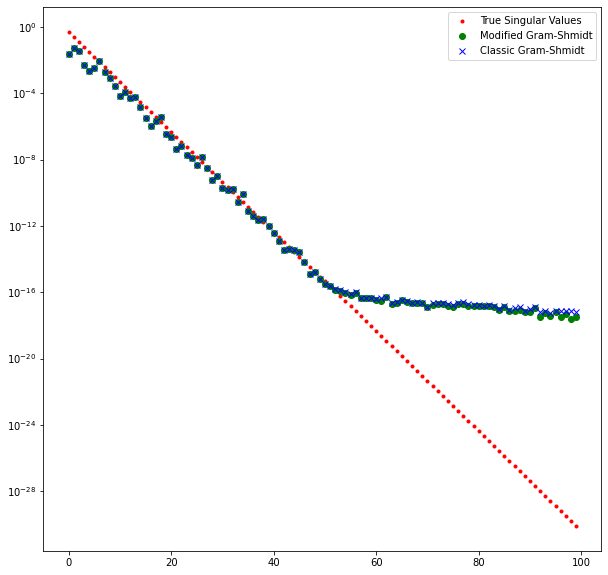

In [ ]:
plt.figure(figsize=(10,10))
plt.semilogy(np.diag(S), 'r.', label="True Singular Values")
plt.semilogy(np.diag(RM), 'go', label="Modified Gram-Shmidt")
plt.semilogy(np.diag(RC), 'bx', label="Classic Gram-Shmidt")
plt.legend()
rcParams.update({'font.size': 18})

### Eigenvalue Decomposition using QR Factorization

Use the QR algorithm (or QR method) to get the eigenvalues of matrix $A$. Do 100 iterations, and print out the 1st, 5th, 10th, 20th and 100th iteration.

 **Reminder**: The QR algorithm (or QR method), uses the QR factorization, but don't confuse the two.

In [ ]:
def qr_algorithm(A, iterations=100):
    m, n = A.shape
    Q = np.eye(m)

    for i in range(iterations):
        Q, R = np.linalg.qr(A @ Q)
        A = R @ Q

        if i + 1 in [1, 5, 10, 20, 100]:
            eigenvalues = np.diag(A)
            print(f"Iteration {i + 1}: Eigenvalues = {eigenvalues}")
    return np.diag(A)
n = 3
A = np.random.rand(n, n).astype(np.float64)
eigenvalues = qr_algorithm(A, iterations=100)

Iteration 1: Eigenvalues = [ 0.2492  0.1858 -0.0004]
Iteration 5: Eigenvalues = [ 0.4796  0.2657 -0.5597]
Iteration 10: Eigenvalues = [-0.1891 -0.3801 -0.5597]
Iteration 20: Eigenvalues = [-0.3373 -0.3222 -0.5597]
Iteration 100: Eigenvalues = [-0.1613 -0.3755 -0.5597]


In [ ]:
A = np.array([1.0, -1.0, 0.0, 0.0, -1.0, 1.0, -1.0, 0.0, 0.0, -1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 3.0]).reshape((4, 4))
print("The matrix: \n", A)

print("\n --- Built-in ---")
print(np.linalg.eig(A)[0])
def qr_algorithm(A, iterations=100):
    m, n = A.shape
    Q = np.eye(m)

    for i in range(iterations):
        Q, R = np.linalg.qr(A @ Q)
        A = R @ Q

    eigenvalues = np.diag(A)
    return eigenvalues

The matrix: 
 [[ 1. -1.  0.  0.]
 [-1.  1. -1.  0.]
 [ 0. -1.  2.  0.]
 [ 0.  0.  0.  3.]]

 --- Built-in ---
[-0.247   1.445   2.8019  3.    ]


##  Q2. SVD & Image processing <sub><sup>``(30 pt.)``</sup></sub>

> In this question, we are going to investigate the use of SVD as a tool to obtain the basis of the matrix in digital image processing.
The first issue we will examine is image compression. For this purpose, in general, we can consider the information inside the image as a data matrix, then find a suitable basis for this information matrix and by depicting the primary matrix on the more important basis vectors and keeping the necessary information to show the initial image with less information.
This process results in image compression. It should be noted that for simplicity, the images we are examining in this exercise are in black and white.
>With the help of SVD, we can find a basis for the column space of the image matrix that we want, so that the columns of the image matrix have the highest correlation with the basis vectors.
>On the other hand, if these bases are considered in descending order of the size of the singular values, they will contain the most general information of the columns of the image, so by keeping only r initial columns of the found bases (U) along with the combined vectors (V) and the singular values (Σ) corresponding to them, we can retain the image's overall image with a good approximation.
>From an expert point of view, the reconstruction is actually a lower-order reconstruction of the primary matrix.
In this view, the value of r is the parameter to control the amount of compression we want.

###  part 1

In this part, the compression operation is performed on the input black and white image with the help of SVD analysis. One of the criteria for comparing the initial and final image is the PSNR criterion. Research about this criterion and draw the PSNR diagram in terms of different r. Then compare the results with the diagram by giving some test inputs and plotting the outputs.
One of the inputs you give to the function should be the image pic.jpg.

In [ ]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


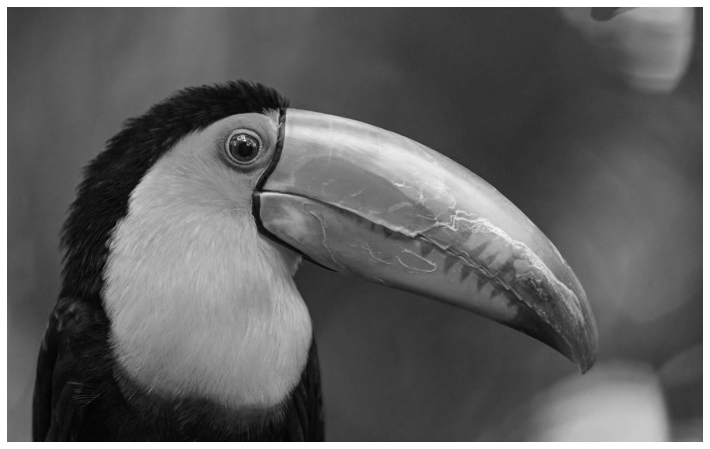

In [ ]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

plt.rcParams['figure.figsize'] = [16, 8]
A = imread(os.path.join('pic.jpg'))
Pic= np.mean(A, -1);
img = plt.imshow(Pic)
img.set_cmap('gray')
plt.axis('off')
plt.show()

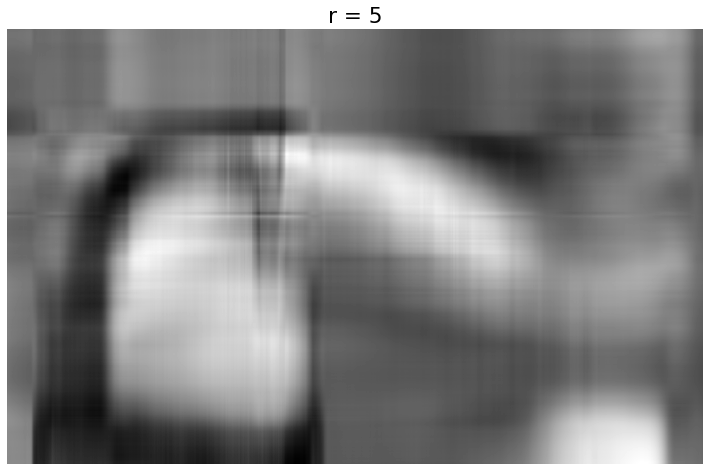

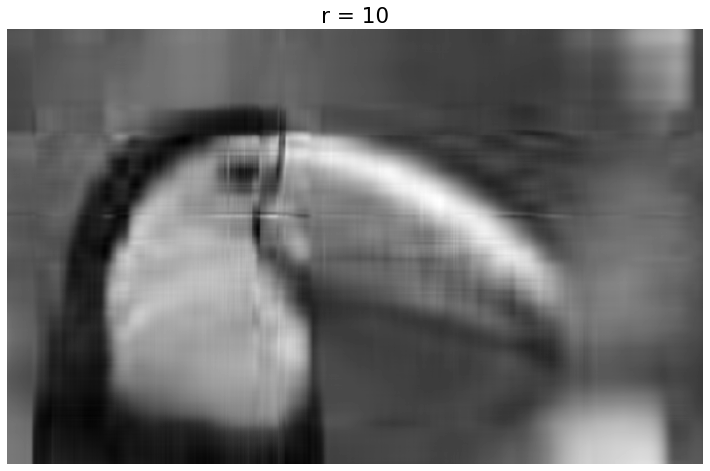

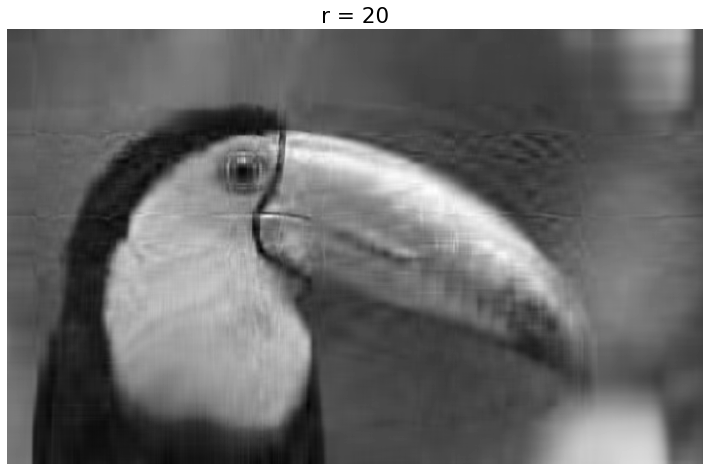

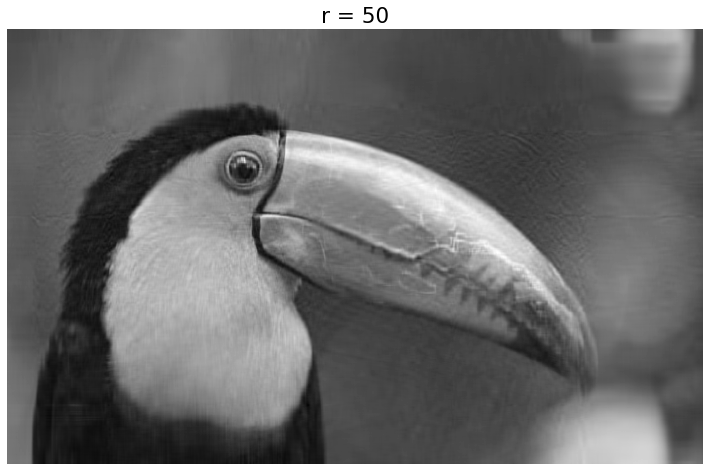

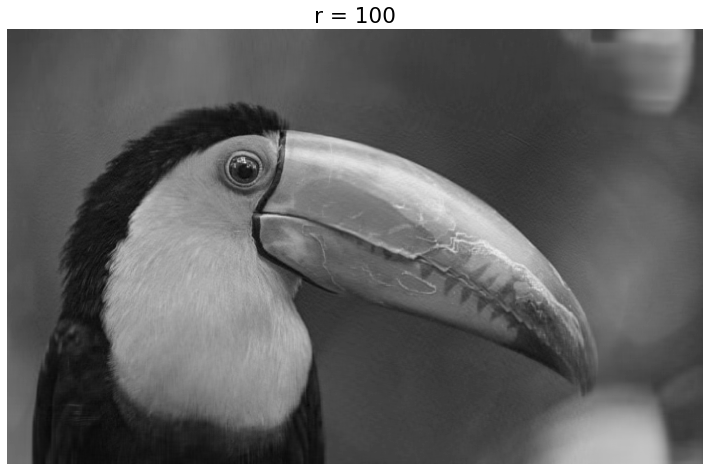

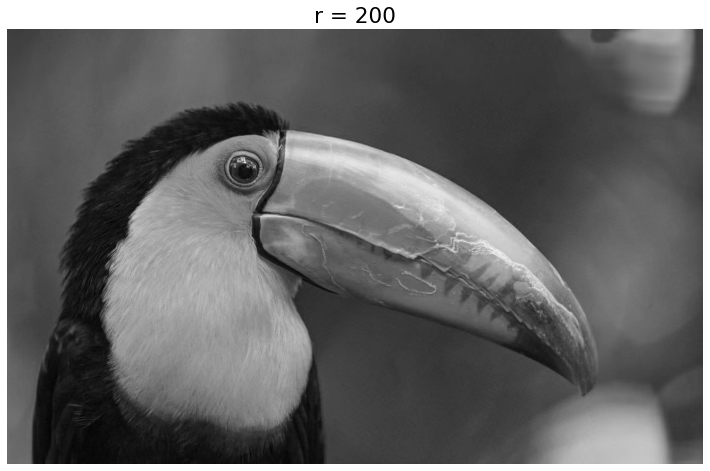

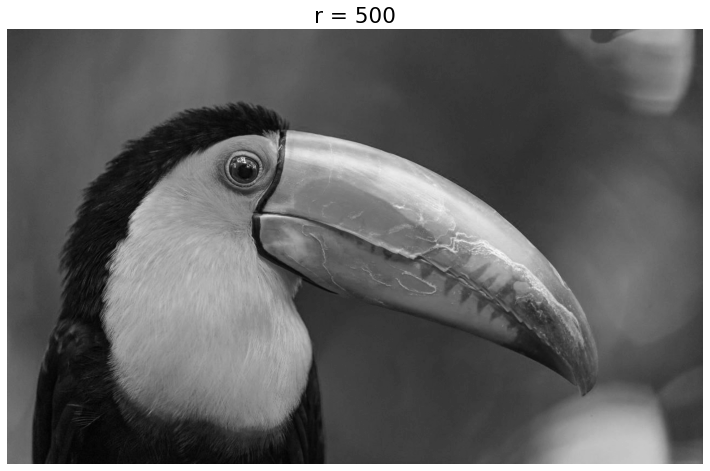

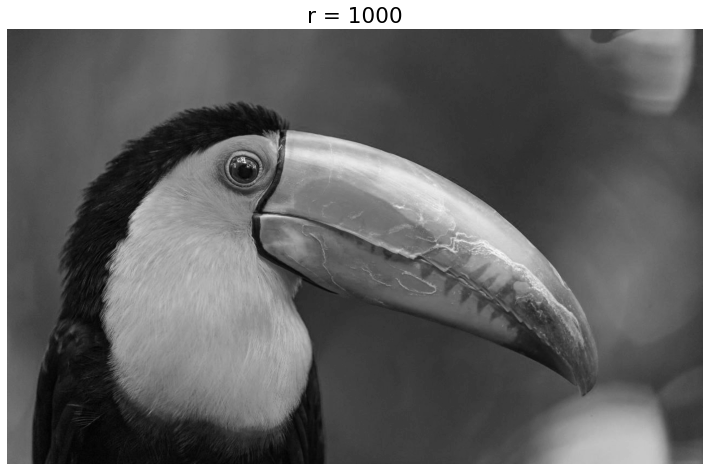

[22.440512453349506, 26.920294664318686, 29.985506827039927, 34.13216833798293, 37.68062767514274, 42.997537974416474, 60.605404960258724, 295.57998861540943]


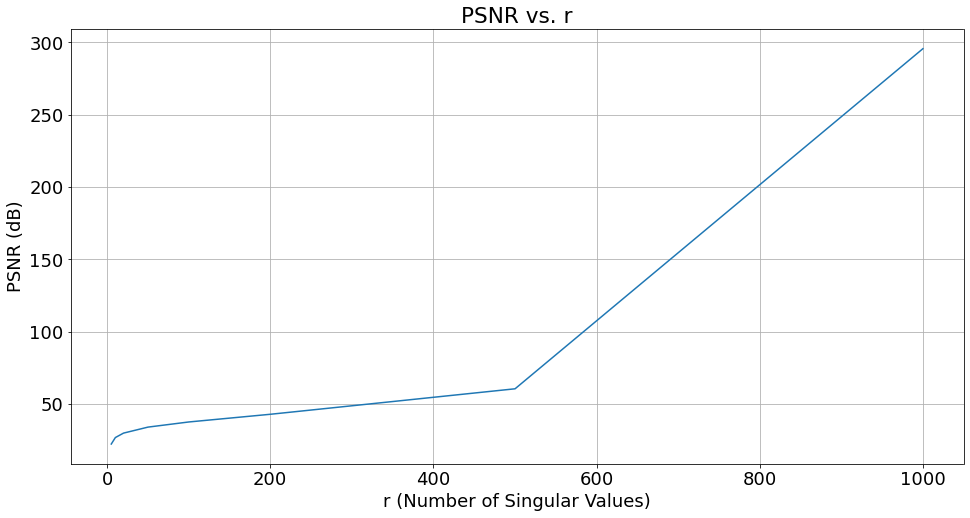

In [ ]:
U, S, VT = np.linalg.svd(Pic,full_matrices=False)
S = np.diag(S)
psnr_values =[]
r_values=[]
j = 0
for r in (5,10, 20,50,100, 200,500,1000):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
    psnr = cv2.PSNR(Pic,Xapprox )
    psnr_values.append(psnr)
    r_values.append(r)

print(psnr_values)
plt.plot(r_values , psnr_values)
plt.title('PSNR vs. r')
plt.xlabel('r (Number of Singular Values)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()


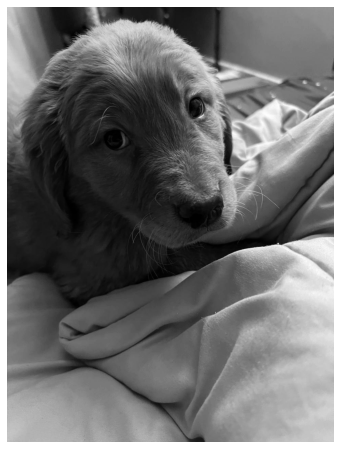

In [ ]:
plt.rcParams['figure.figsize'] = [16, 8]
A = imread(os.path.join('dog.jpeg'))
Dog = np.mean(A, -1);
img = plt.imshow(Dog)
img.set_cmap('gray')
plt.axis('off')
plt.show()

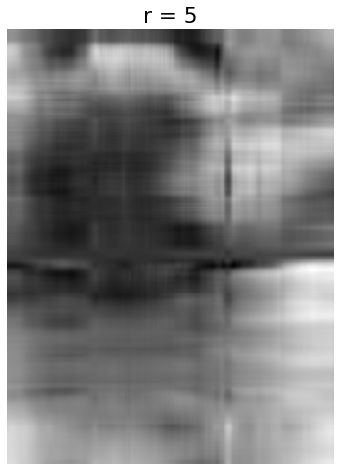

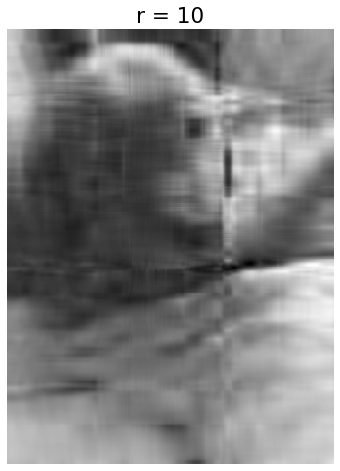

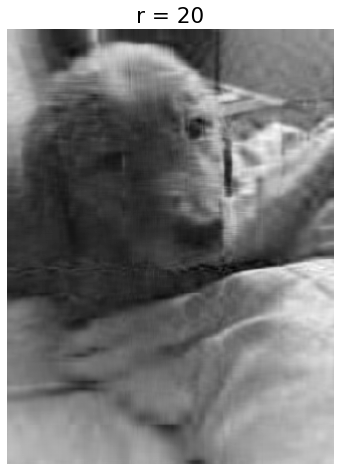

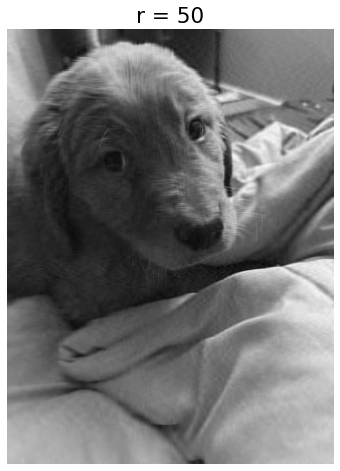

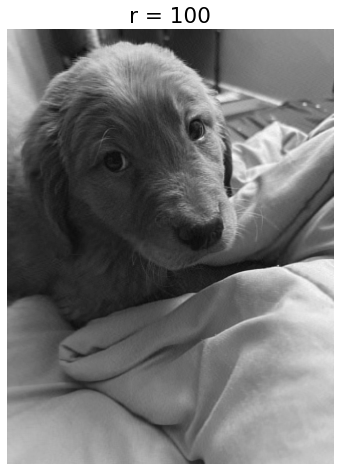

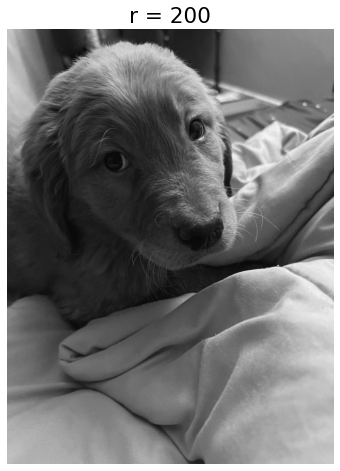

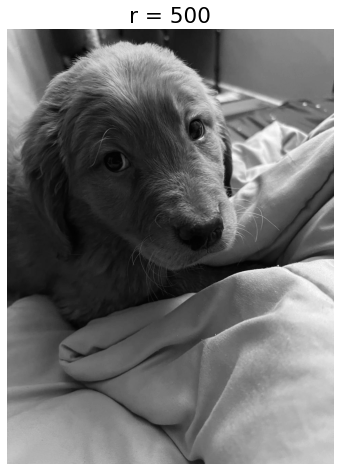

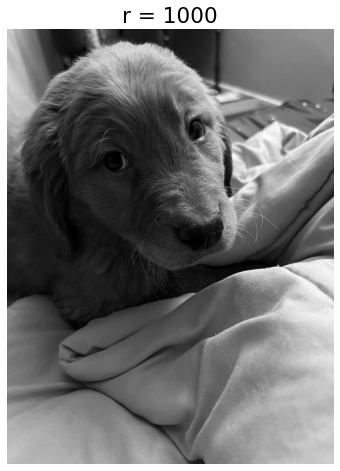

[20.93873882381823, 24.262896666191804, 27.447358632133994, 31.890855461332354, 35.23645922071475, 39.85565794956811, 52.86860776298509, 298.2947715094964]


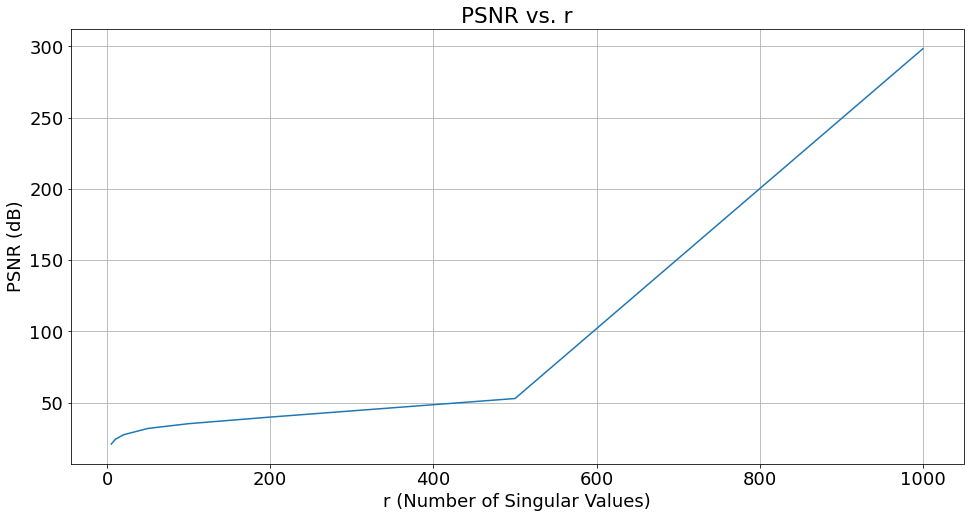

In [ ]:
U, S, VT = np.linalg.svd(Dog,full_matrices=False)
S = np.diag(S)
psnr_values =[]
r_values=[]
j = 0
for r in (5,10, 20,50,100, 200,500,1000):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
    psnr = cv2.PSNR(Dog,Xapprox )
    psnr_values.append(psnr)
    r_values.append(r)

print(psnr_values)
plt.plot(r_values , psnr_values)
plt.title('PSNR vs. r')
plt.xlabel('r (Number of Singular Values)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()

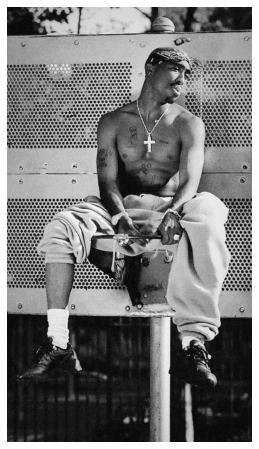

In [ ]:
plt.rcParams['figure.figsize'] = [16, 8]
A = imread(os.path.join('tupac.jpeg'))
Tupac = np.mean(A, -1); # Convert RGB to grayscale
img = plt.imshow(Tupac)
img.set_cmap('gray')
plt.axis('off')
plt.show()

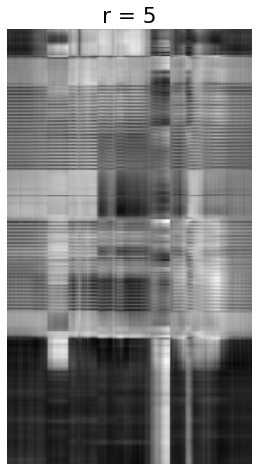

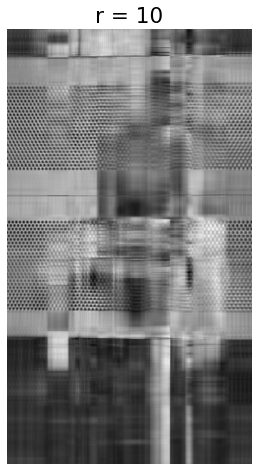

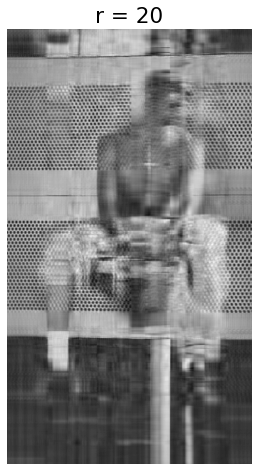

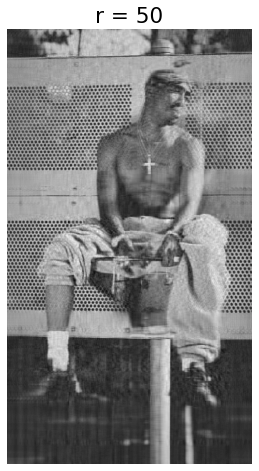

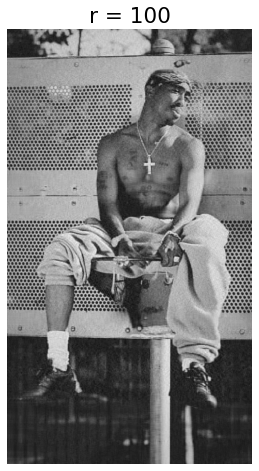

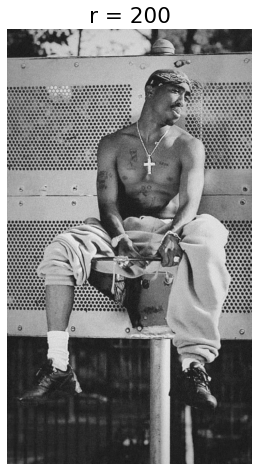

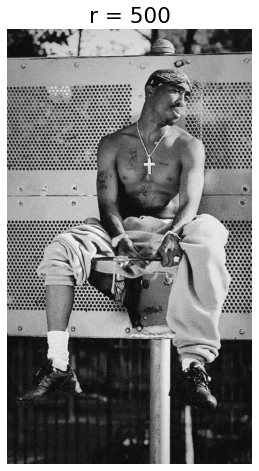

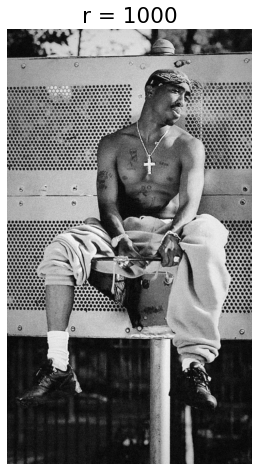

[15.573718312369282, 17.303082202577137, 19.768984741262766, 23.486434610375166, 26.97004441716411, 31.545884712561424, 44.739324003479496, 294.27888812556506]


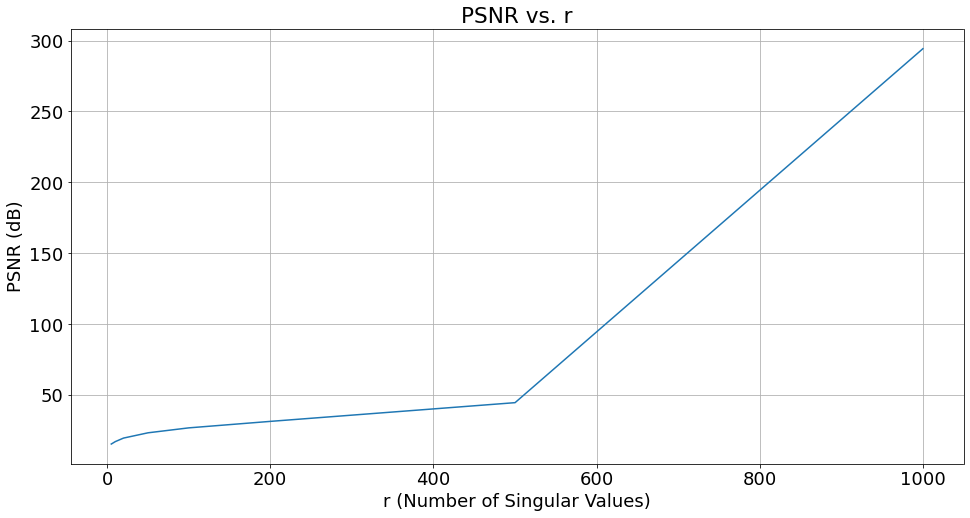

In [ ]:
U, S, VT = np.linalg.svd(Tupac,full_matrices=False)
S = np.diag(S)
psnr_values =[]
r_values=[]
j = 0
for r in (5,10,20,50,100, 200,500,1000):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
    psnr = cv2.PSNR(Tupac,Xapprox )
    psnr_values.append(psnr)
    r_values.append(r)

print(psnr_values)
plt.plot(r_values , psnr_values)
plt.title('PSNR vs. r')
plt.xlabel('r (Number of Singular Values)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()

###  part 2

Another issue that we can explore with a similar idea of applying base transform is removing noise from images. In the condition that the noise in the image is uniform and in such a way that it does not distort the general information in the image. from the point of view of SVD, according to the examination of the general information, the direction of the image vector on bases with larger singular values has not changed much, and removing the information related to Examining general information to vectors with less importance can remove noise and keep the main information of the image.
In this part, add two different noises salt and pepper and Gaussian noise with a desired and appropriate range to the image pic.jpg so that the PSNR of both images is in the same range, then perform the noise reduction process with the help of SVD analysis.
For both noises, draw the PSNR diagram in terms of different r.
  Then compare the results with the graph by plotting a number of outputs.
  Which of the noises is more effective in this method?

    Salt and pepper is more effective.

/var/folders/65/bf82v36x7pb1bp3trrt6lssr0000gn/T/ipykernel_9630/1937086330.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  noisy_image[coords] = 255
/var/folders/65/bf82v36x7pb1bp3trrt6lssr0000gn/T/ipykernel_9630/1937086330.py:13: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  noisy_image[coords] = 0


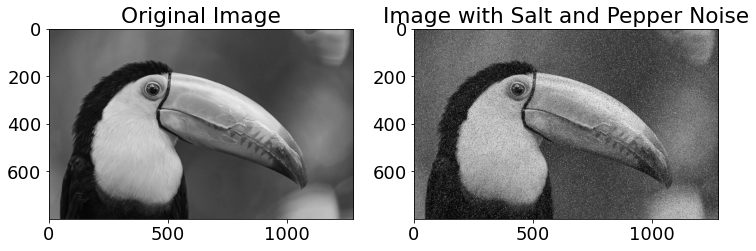

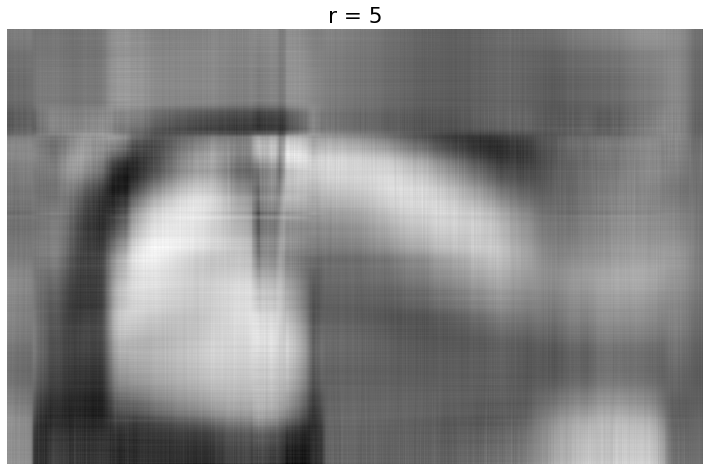

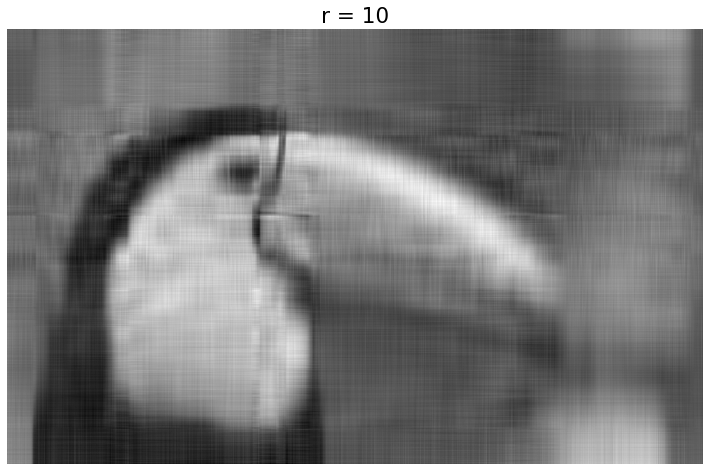

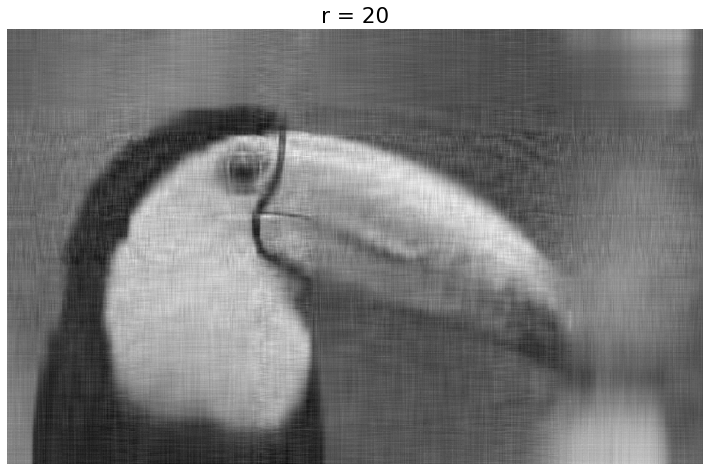

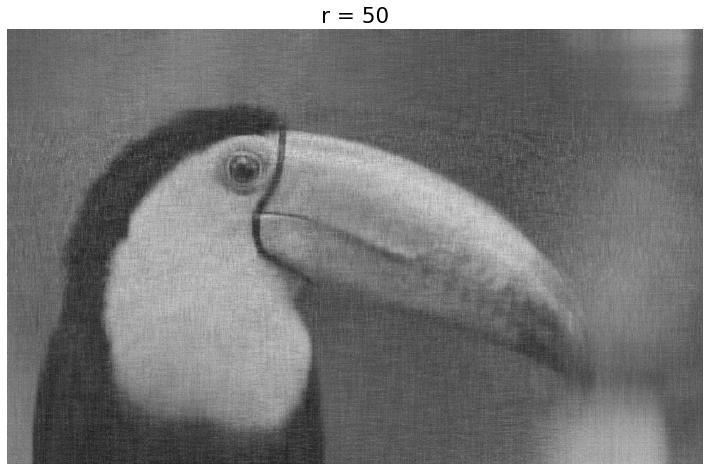

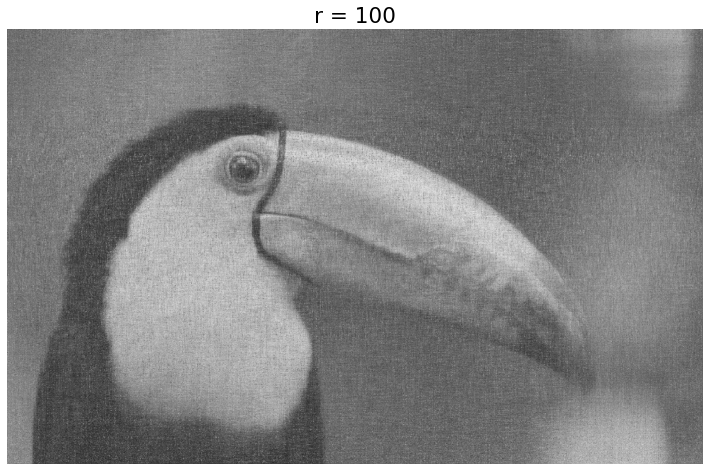

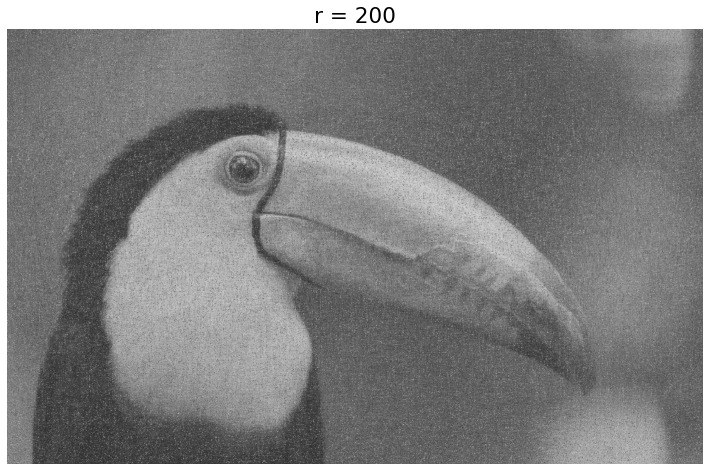

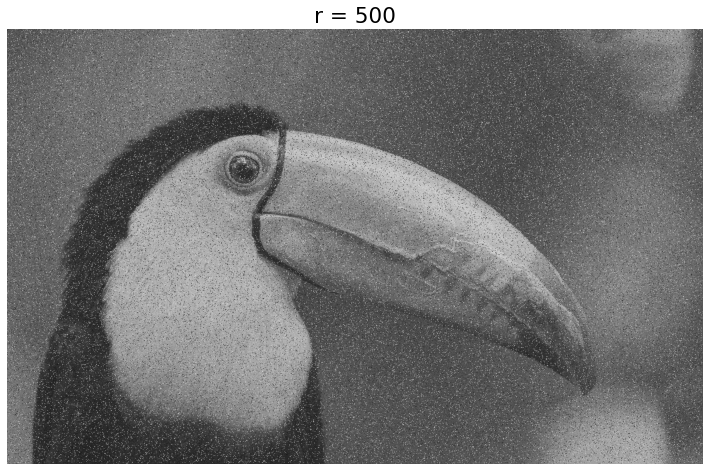

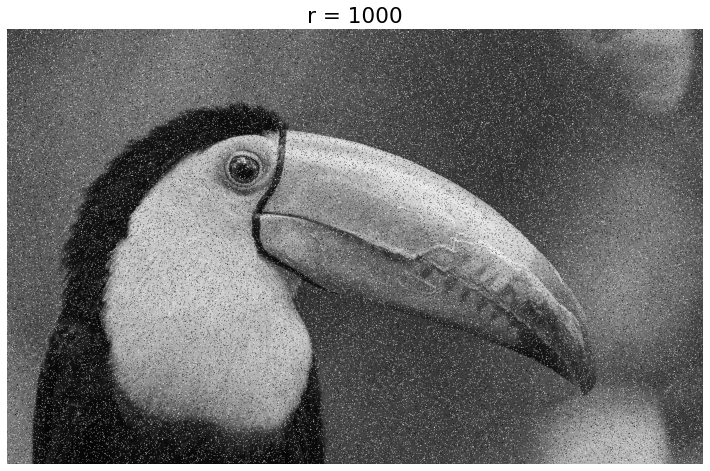

[20.283124191027827, 22.068240829980827, 22.18366285570758, 20.631566205999494, 18.981899255529065, 17.230887236990316, 15.374575620321416, 14.991958474454268]


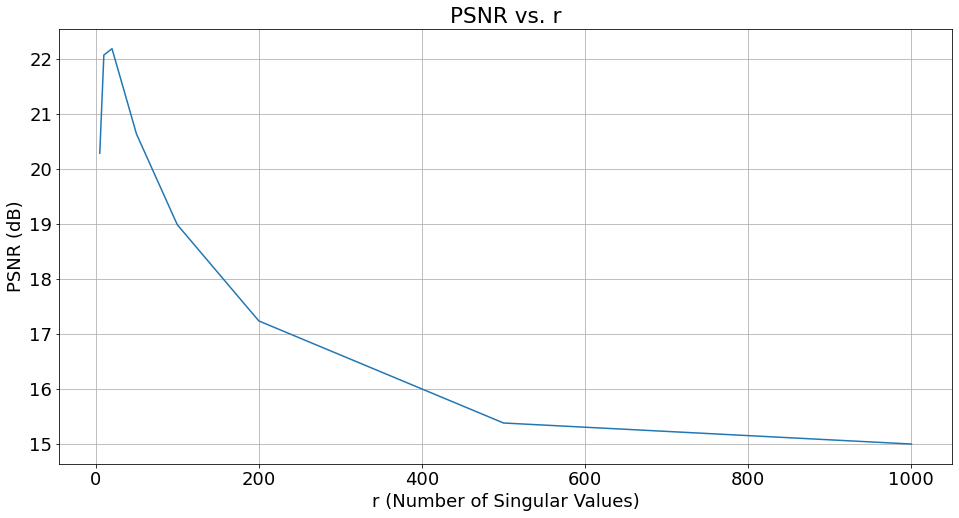

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    noisy_image = np.copy(image)
    num_salt = np.ceil(salt_prob * image.size)
    num_pepper = np.ceil(pepper_prob * image.size)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[coords] = 255
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[coords] = 0
    return noisy_image

image_path = "pic.jpg"
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
noisy_image = add_salt_and_pepper_noise(original_image, salt_prob=0.05, pepper_prob=0.05)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.subplot(122)
plt.imshow(noisy_image, cmap='gray')
plt.title("Image with Salt and Pepper Noise")
plt.show()

U, S, VT = np.linalg.svd(noisy_image,full_matrices=False)
S = np.diag(S)
psnr_values =[]
r_values=[]
j = 0
for r in (5,10, 20,50,100, 200,500,1000):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
    psnr = cv2.PSNR(Pic,Xapprox )
    psnr_values.append(psnr)
    r_values.append(r)

print(psnr_values)
plt.plot(r_values , psnr_values)
plt.title('PSNR vs. r')
plt.xlabel('r (Number of Singular Values)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()

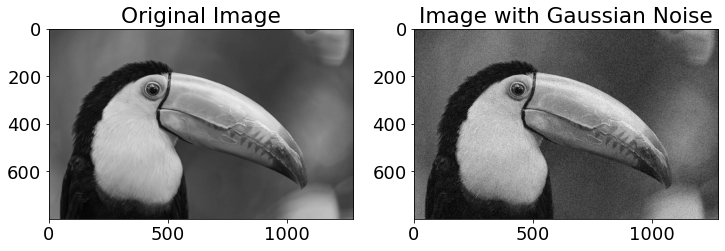

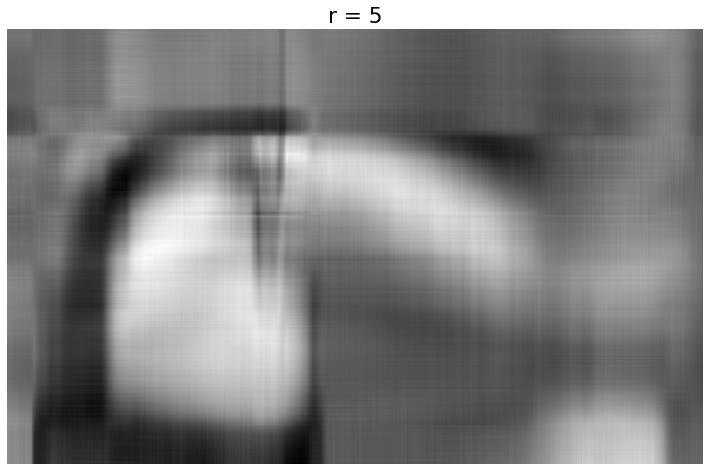

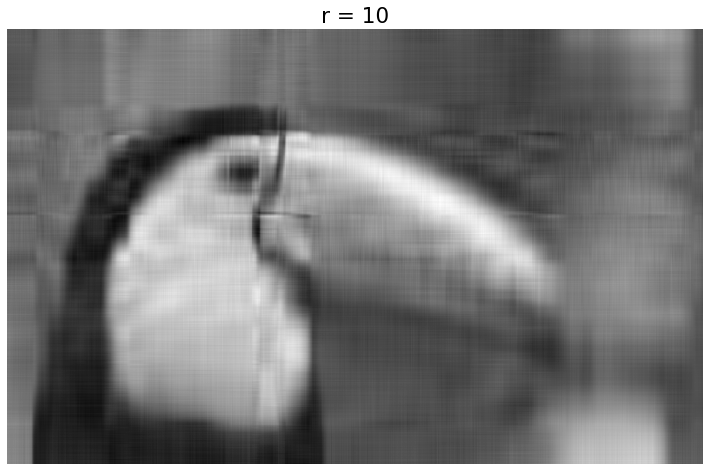

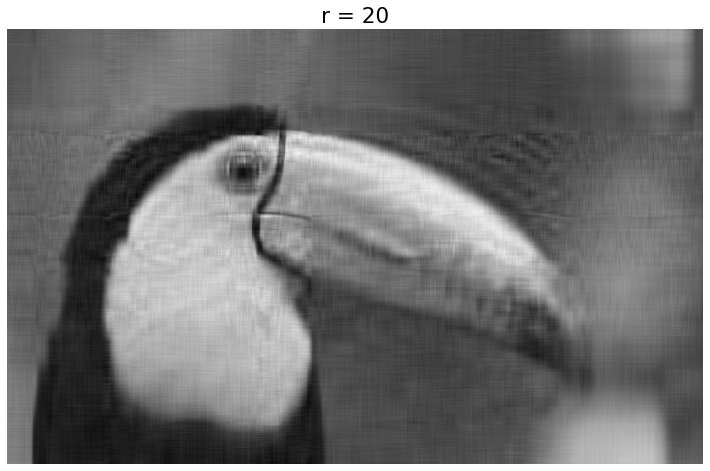

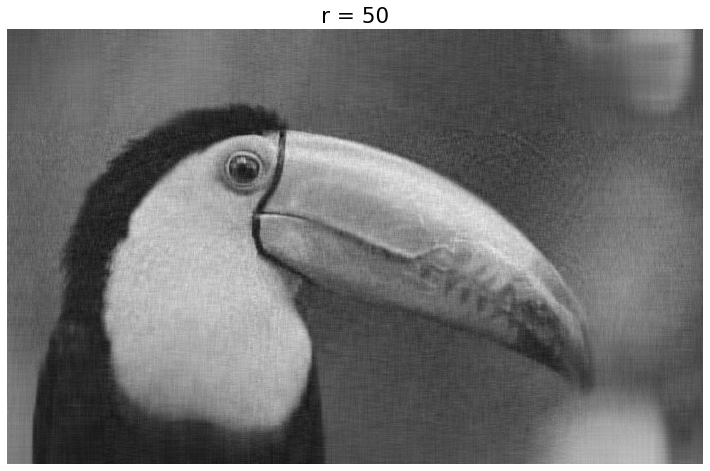

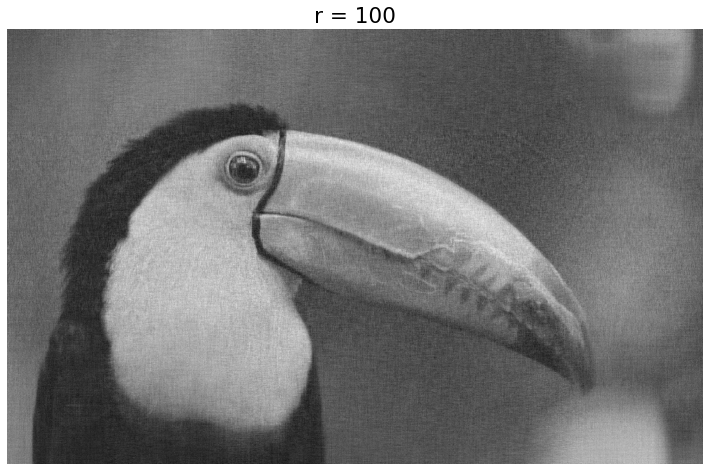

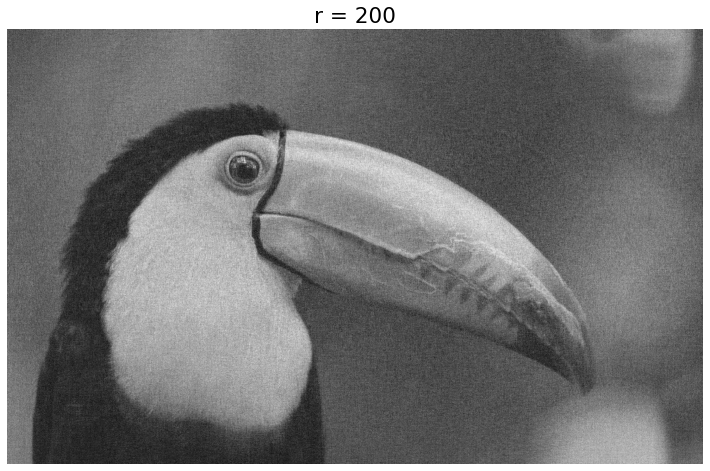

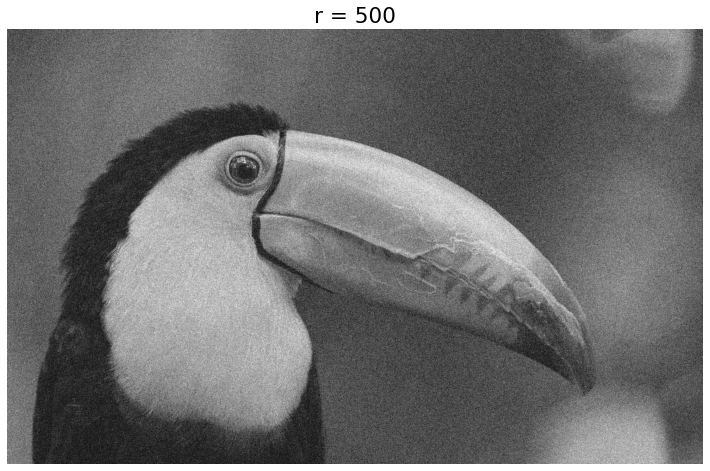

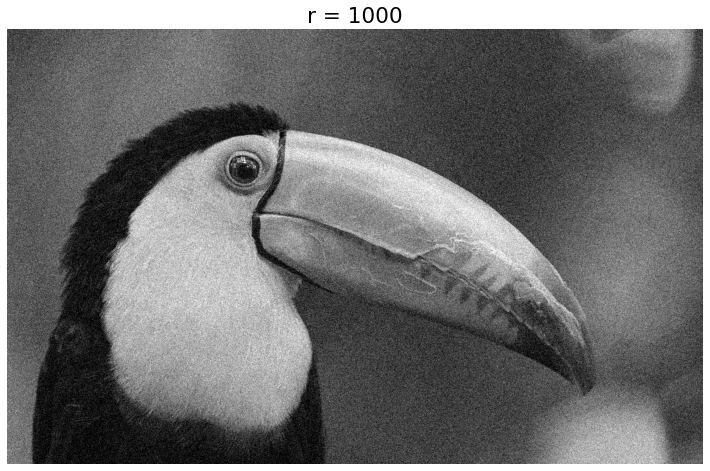

[20.605997244987996, 22.730779053016565, 23.432624809652562, 23.147688227217195, 22.148753298832418, 20.89911249027181, 19.408300626534793, 19.08363366544082]


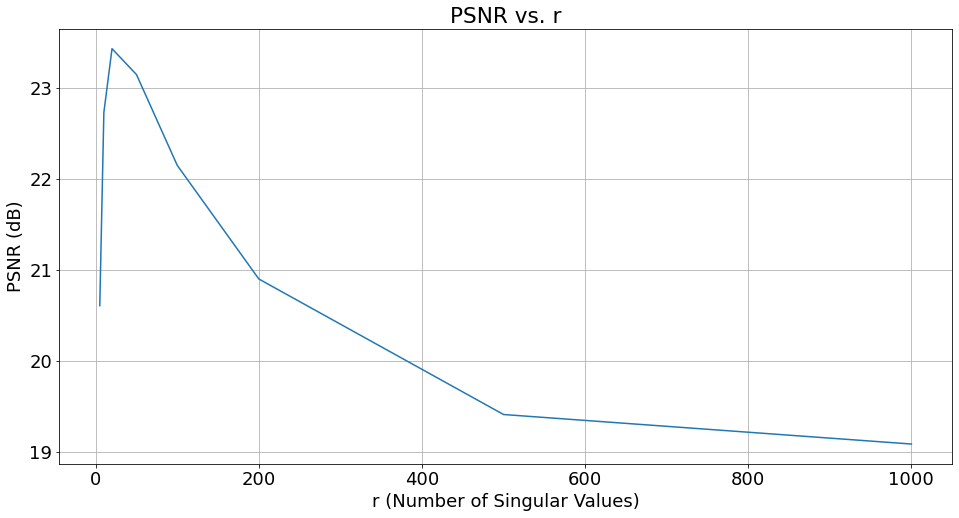

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_gaussian_noise(image, mean=0, sigma=25):
    gauss = np.random.normal(mean, sigma, image.shape).reshape(image.shape)
    noisy_image = image + gauss
    noisy_image = np.clip(noisy_image, 0, 255)
    noisy_image = noisy_image.astype(np.uint8)
    return noisy_image

image_path = "pic.jpg"
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
noisy_image = add_gaussian_noise(original_image)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.subplot(122)
plt.imshow(noisy_image, cmap='gray')
plt.title("Image with Gaussian Noise")
plt.show()

U, S, VT = np.linalg.svd(noisy_image,full_matrices=False)
S = np.diag(S)
psnr_values =[]
r_values=[]
j = 0
for r in (5,10, 20,50,100, 200,500,1000):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
    psnr = cv2.PSNR(Pic,Xapprox )
    psnr_values.append(psnr)
    r_values.append(r)

print(psnr_values)
plt.plot(r_values , psnr_values)
plt.title('PSNR vs. r')
plt.xlabel('r (Number of Singular Values)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()

##  Q3. PCA and Clustering <sub><sup>``(40 pt.)``</sup></sub>
In this problem we want to cluster some data points.
But first, you should reduce the number of features by the PCA algorithm then use kmeans clustering algorithm

In [ ]:
pip install KElbowVisualizer

ERROR: Could not find a version that satisfies the requirement KElbowVisualizer (from versions: none)
ERROR: No matching distribution found for KElbowVisualizer


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score as sil, calinski_harabasz_score as chs, silhouette_samples

### Import Dataset

In [ ]:
Datapoint = pd.read_csv('/Datapoint.csv')


### Correlation Heatmap

In this part plot the correlation Heatmap of features.
what is your suggestion about the number of principal components that they have high variance? Explain why.

    This code first plots the correlation heatmap of features using seaborn. Then, it performs PCA analysis and generates a scree plot to visualize the cumulative explained variance. Finally, it identifies the number of principal components that capture a specified amount of variance (e.g., 95%). Adjust the threshold_variance variable if needed.

    The scree plot helps you decide how many principal components to retain based on the explained variance. Typically, you might choose the number of components that explain a significant portion of the variance (e.g., 95%) to reduce dimensionality while retaining most of the information.

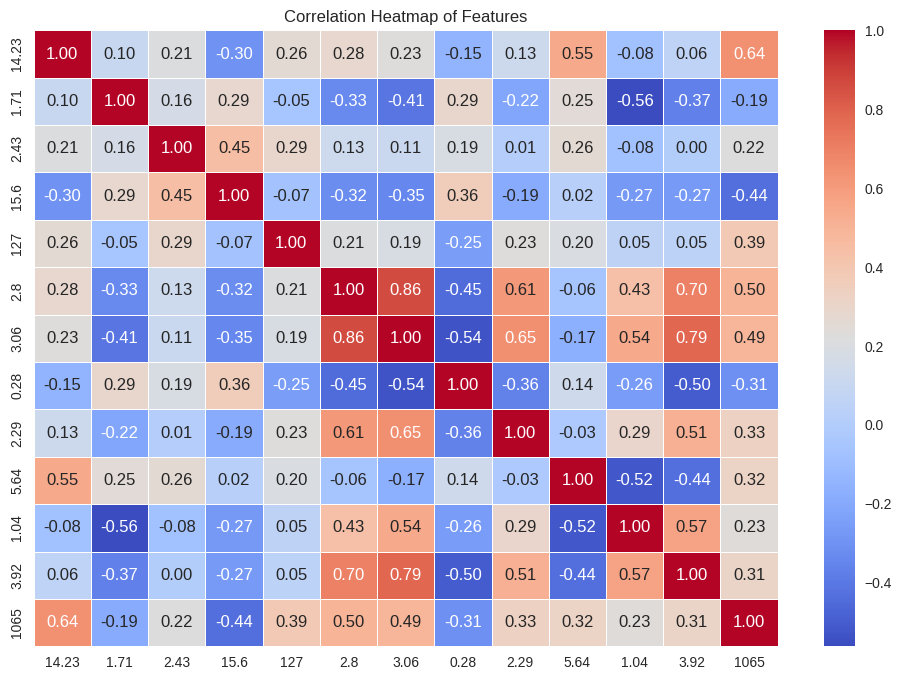

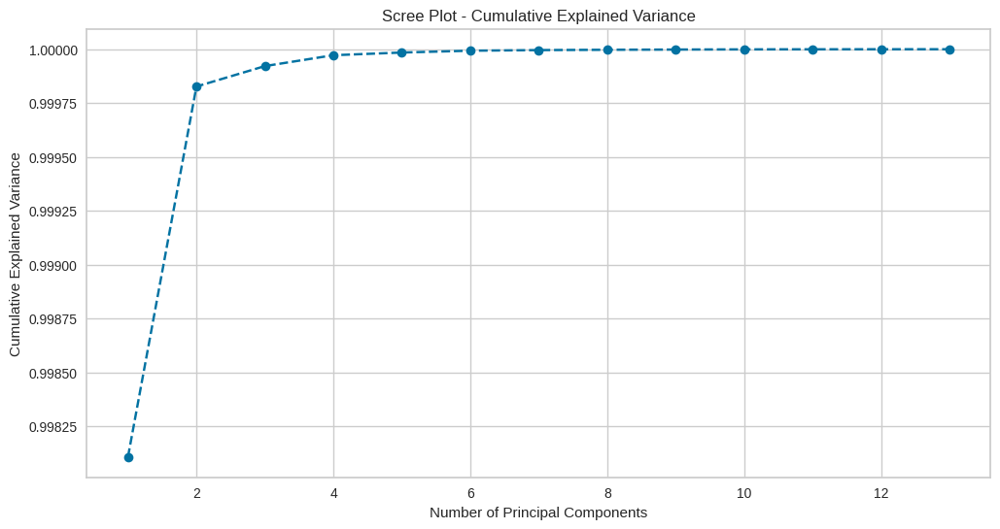

The number of principal components with 95.0% variance: 1


In [ ]:
from sklearn.decomposition import PCA
correlation_matrix = Datapoint.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Features')
plt.show()

X = Datapoint.values
pca = PCA()
pca.fit(X)
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Scree Plot - Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

threshold_variance = 0.95
num_components_high_variance = np.argmax(cumulative_explained_variance >= threshold_variance) + 1
print(f'The number of principal components with {threshold_variance * 100}% variance: {num_components_high_variance}')

###  Data Preprocessing

In [ ]:
Datapoint.head()

,14.23,1.71,2.43,15.6,127,2.8,3.06,0.28,2.29,5.64,1.04,3.92,1065
0,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
2,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
3,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
4,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450


### PCA (Principal Component Analysis)
> As you know for applying PCA we should scale our data points.Here we use MinMax and Standard Scaler.
(First, use Standard Scaler)

Calculate principal components and plot Explained variance by each component.

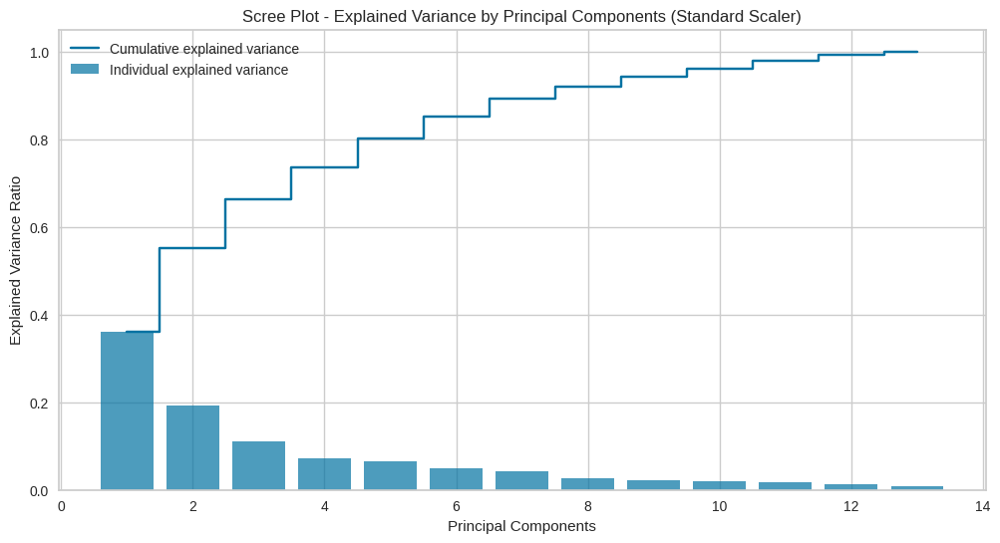

In [ ]:
from sklearn.preprocessing import StandardScaler
X = Datapoint.values
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)
pca_standardized = PCA()
principal_components_standardized = pca_standardized.fit_transform(X_standardized)
explained_variance_ratio_standardized = pca_standardized.explained_variance_ratio_
cumulative_explained_variance_standardized = np.cumsum(explained_variance_ratio_standardized)

plt.figure(figsize=(12, 6))
plt.bar(range(1, len(explained_variance_ratio_standardized) + 1), explained_variance_ratio_standardized, alpha=0.7, align='center', label='Individual explained variance')
plt.step(range(1, len(cumulative_explained_variance_standardized) + 1), cumulative_explained_variance_standardized, where='mid', label='Cumulative explained variance')
plt.title('Scree Plot - Explained Variance by Principal Components (Standard Scaler)')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.legend()
plt.grid(True)
plt.show()


Apply PCA Algorithm from scratch and reduce the number of features to the number you have guessed in previous parts.

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -2.230243 -0.302313  2.032920 -0.281906 -0.259540 -0.927615 -0.079724   
1 -2.531922  1.062257 -0.976724  0.735727 -0.198602  0.557252 -0.432350   
2 -3.754677  2.805309  0.180370  0.577125 -0.257871  0.100109  0.364924   
3 -1.020131  0.888380 -2.023870 -0.432792  0.275235 -0.403139 -0.454721   
4 -3.049199  2.170007  0.638747 -0.487628 -0.631358  0.130817 -0.421297   

        PC8       PC9      PC10  
0  1.026470 -0.313145  0.131256  
1 -0.335611 -1.179069  0.006752  
2  0.646847  0.067906  0.373320  
3  0.412033  0.338059 -0.096320  
4  0.398731 -0.113454 -0.020025  


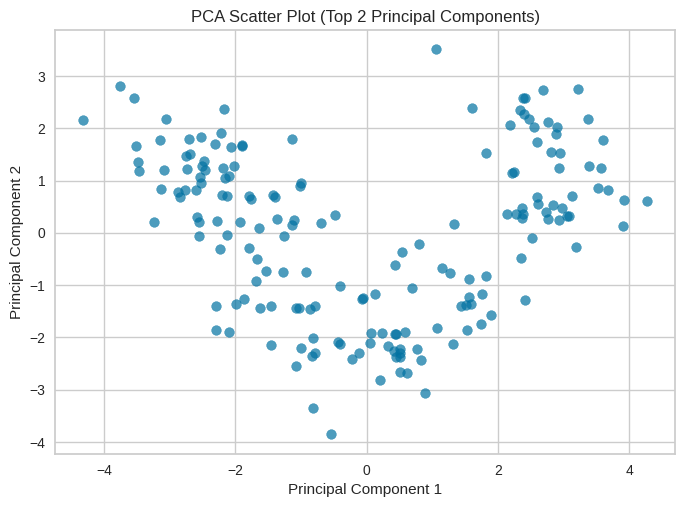

In [ ]:
X = Datapoint.values
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)
covariance_matrix = np.cov(X_standardized, rowvar=False)
eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]
threshold_variance = 0.95
cumulative_explained_variance_ratio = np.cumsum(eigenvalues) / np.sum(eigenvalues)
num_components_high_variance = np.argmax(cumulative_explained_variance_ratio >= threshold_variance) + 1
top_eigenvectors = eigenvectors[:, :num_components_high_variance]
X_pca = X_standardized.dot(top_eigenvectors)
reduced_datapoint = pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, num_components_high_variance + 1)])
print(reduced_datapoint.head())

plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)
plt.title('PCA Scatter Plot (Top 2 Principal Components)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


### PCA plot in 2D
Plot data points using their two first features.What do you think about the number of clusters?

    This code uses the two first principal components obtained from PCA to plot a 2D scatter plot of the data points. The resulting plot can provide insights into the potential structure or clusters in the data. Observe any discernible patterns or groupings that may suggest the number of clusters.

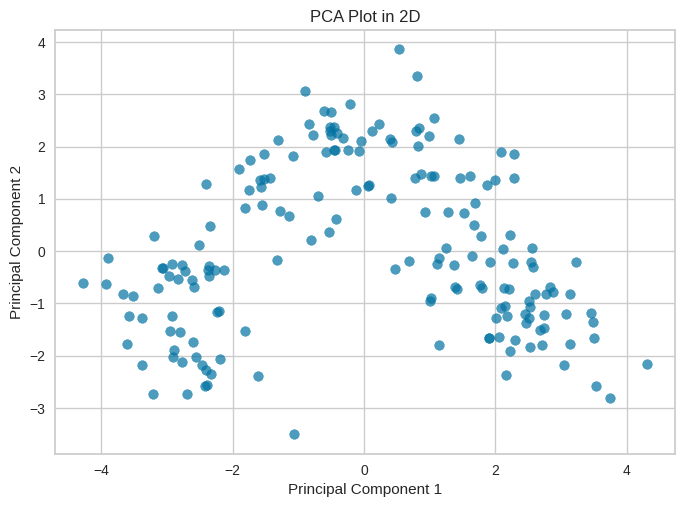

In [ ]:
X = Datapoint.values
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_standardized)

plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)
plt.title('PCA Plot in 2D')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

### Do all previous steps for MinMax Scaling
Tell your opinion about diffrences.




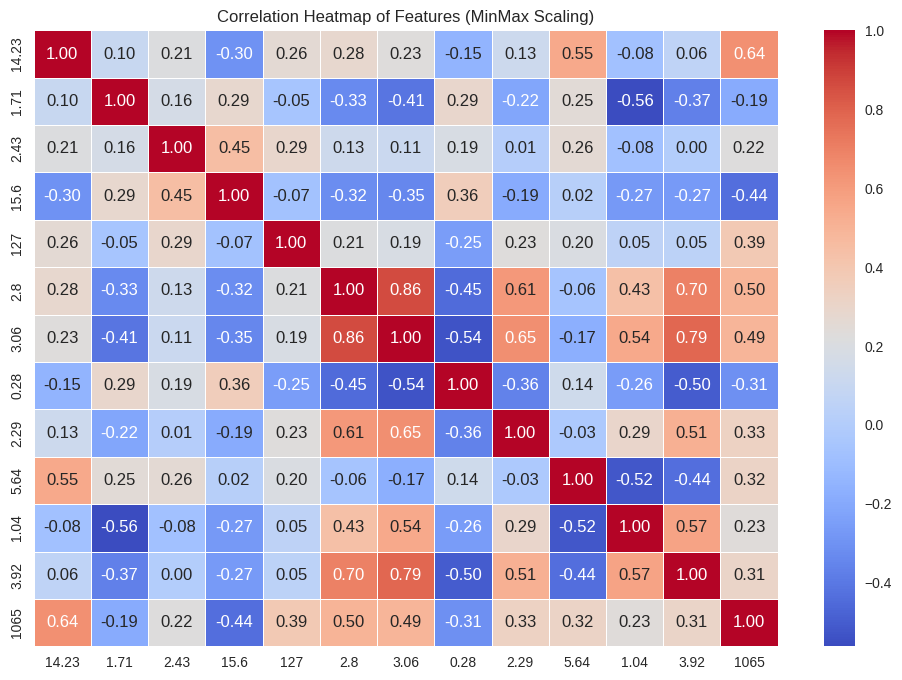

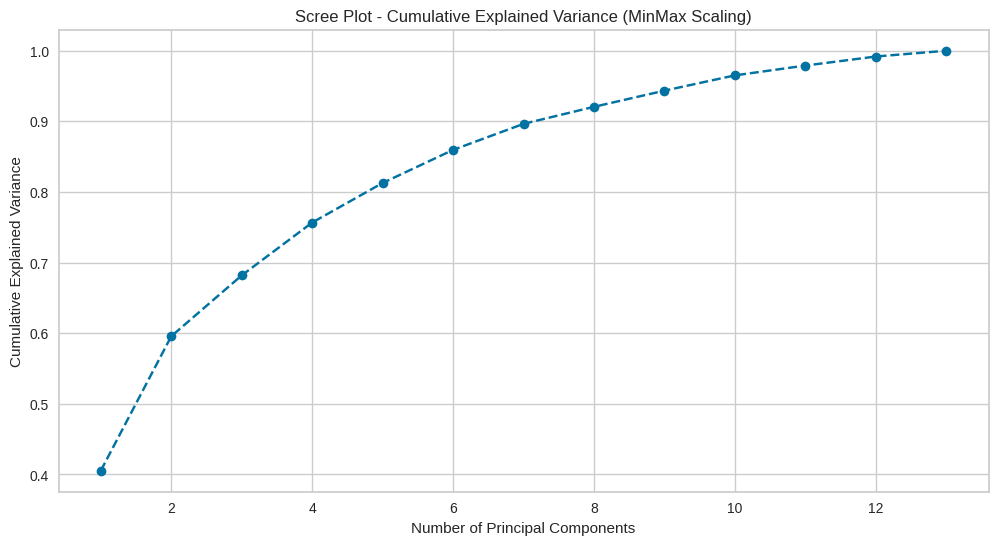

The number of principal components with 95.0% variance: 10
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -1.087172  0.653951 -0.708106 -0.450861  0.244495 -0.241038 -0.074405   
1 -1.122554  0.835227 -1.185218 -0.542147 -0.038428 -0.082481 -0.200315   
2 -1.419565  1.229577 -1.070505 -0.513959  0.011816 -0.089142 -0.006467   
3 -0.804054  0.701831 -1.288779 -0.628678 -0.100134 -0.284621 -0.130364   
4 -1.207156  1.134522 -0.913833 -0.710499  0.075405 -0.143566 -0.149603   

        PC8       PC9      PC10  
0 -0.099329 -0.120739 -0.139760  
1 -0.343459  0.065836  0.024333  
2 -0.141048 -0.104285 -0.090783  
3 -0.277570 -0.278913 -0.102188  
4 -0.194889 -0.145961 -0.008065  


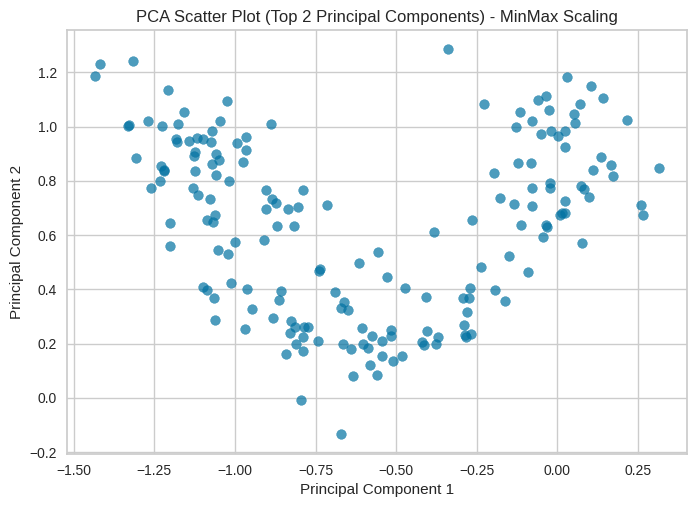

In [ ]:
from sklearn.preprocessing import MinMaxScaler
X = Datapoint.values
scaler = MinMaxScaler()
X_minmax_scaled = scaler.fit_transform(X)
correlation_matrix_minmax = pd.DataFrame(X_minmax_scaled, columns=Datapoint.columns).corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_minmax, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Features (MinMax Scaling)')
plt.show()

pca_minmax = PCA()
principal_components_minmax = pca_minmax.fit_transform(X_minmax_scaled)
explained_variance_ratio_minmax = pca_minmax.explained_variance_ratio_
cumulative_explained_variance_minmax = np.cumsum(explained_variance_ratio_minmax)

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(explained_variance_ratio_minmax) + 1), cumulative_explained_variance_minmax, marker='o', linestyle='--')
plt.title('Scree Plot - Cumulative Explained Variance (MinMax Scaling)')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

threshold_variance = 0.95
num_components_high_variance_minmax = np.argmax(cumulative_explained_variance_minmax >= threshold_variance) + 1
print(f'The number of principal components with {threshold_variance * 100}% variance: {num_components_high_variance_minmax}')
covariance_matrix_minmax = np.cov(X_minmax_scaled, rowvar=False)
eigenvalues_minmax, eigenvectors_minmax = np.linalg.eigh(covariance_matrix_minmax)
sorted_indices_minmax = np.argsort(eigenvalues_minmax)[::-1]
eigenvalues_minmax = eigenvalues_minmax[sorted_indices_minmax]
eigenvectors_minmax = eigenvectors_minmax[:, sorted_indices_minmax]
num_components_high_variance_minmax = np.argmax(np.cumsum(eigenvalues_minmax) / np.sum(eigenvalues_minmax) >= threshold_variance) + 1
top_eigenvectors_minmax = eigenvectors_minmax[:, :num_components_high_variance_minmax]
X_pca_minmax = X_minmax_scaled.dot(top_eigenvectors_minmax)
reduced_datapoint_minmax = pd.DataFrame(X_pca_minmax, columns=[f'PC{i}' for i in range(1, num_components_high_variance_minmax + 1)])
print(reduced_datapoint_minmax.head())

plt.scatter(X_pca_minmax[:, 0], X_pca_minmax[:, 1], alpha=0.7)
plt.title('PCA Scatter Plot (Top 2 Principal Components) - MinMax Scaling')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

Differences Between Standard Scaler and MinMax Scaler
Scaling Effect: MinMax Scaler scales the features such that they are in a range between 0 and 1, whereas Standard Scaler standardizes features by removing the mean and scaling to unit variance. This difference in scaling approaches can lead to different PCA results, especially if the data has outliers or is not normally distributed.
PCA Results: The explained variance ratio might differ between the two scaling methods. This is because PCA is sensitive to the scaling of the data. MinMax scaling preserves the original distribution without adjusting for variance, while Standard Scaler standardizes the variance across features.
2D PCA Plot: The distribution and orientation of data points in the 2D PCA plot may vary depending on the scaling method used. This reflects how the scaling method influences the PCA’s assessment of data variability.
When comparing the results of PCA with different scaling methods, it's important to consider the nature of your data and the specific requirements of your analysis.

### KMeans Clustering
#### Elbow Method for Determining Cluster Amount on  Dataset

Using the elbow method to find the optimal number of clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

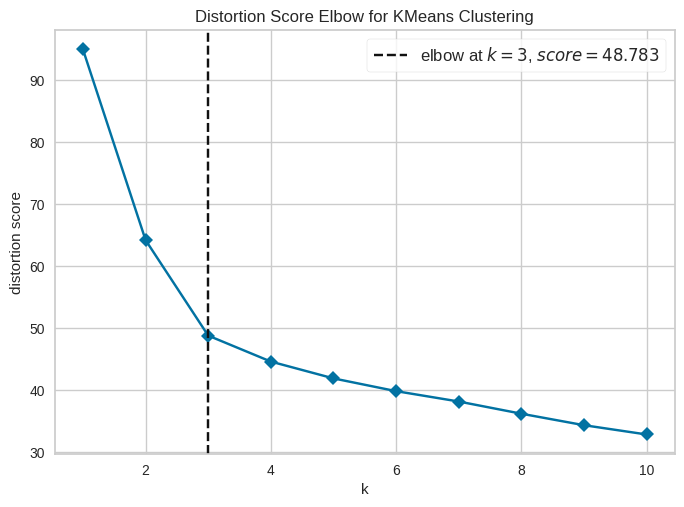

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_minmax_scaled = scaler.fit_transform(Datapoint)
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 11), metric='distortion', timings=False)
visualizer.fit(X_minmax_scaled)
visualizer.show()

What is inertia and silhouette metrics?
Explain them briefly.




In [ ]:
scaler = StandardScaler()
X_standardized = scaler.fit_transform(Datapoint)
pca = PCA(n_components=2)
pca_std_datapoint = pca.fit_transform(X_standardized)
pca_std_datapoint_df = pd.DataFrame(pca_std_datapoint, columns=['PC1', 'PC2'])
print(pca_std_datapoint_df.head())

        PC1       PC2
0  2.230243  0.302313
1  2.531922 -1.062257
2  3.754677 -2.805309
3  1.020131 -0.888380
4  3.049199 -2.170007


In [ ]:
inertia = []
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter= 500, random_state=17)
    kmeans.fit(pca_std_datapoint)
    inertia.append(kmeans.inertia_)

100%|██████████| 8/8 [00:00<00:00, 30.85it/s]


In [ ]:
silhouette = {}
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter=500, random_state=17)
    kmeans.fit(pca_std_datapoint)
    silhouette[i] = sil(pca_std_datapoint, kmeans.labels_, metric='euclidean')

100%|██████████| 8/8 [00:00<00:00,  9.01it/s]


Plot the **inertia** and **silhouette ** values

100%|██████████| 8/8 [00:02<00:00,  3.72it/s]


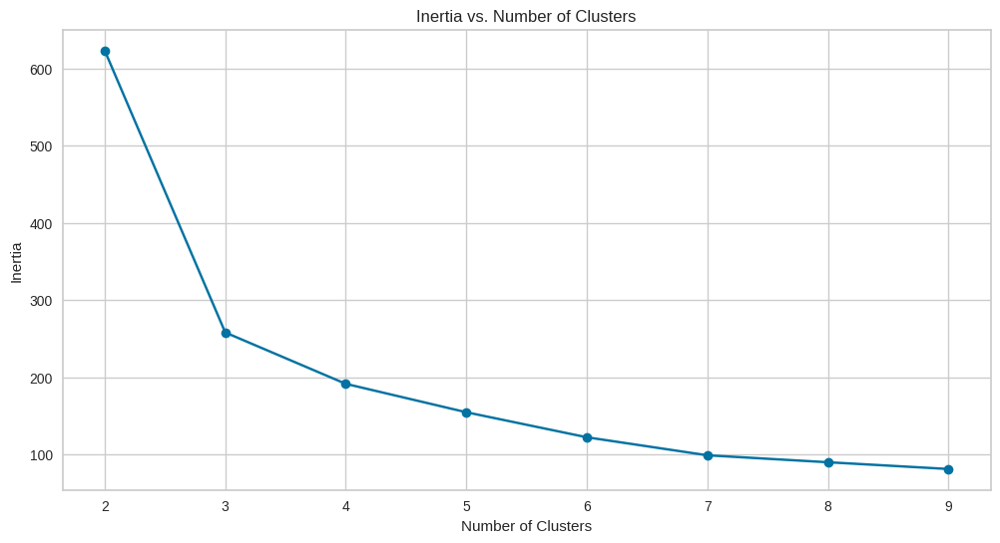

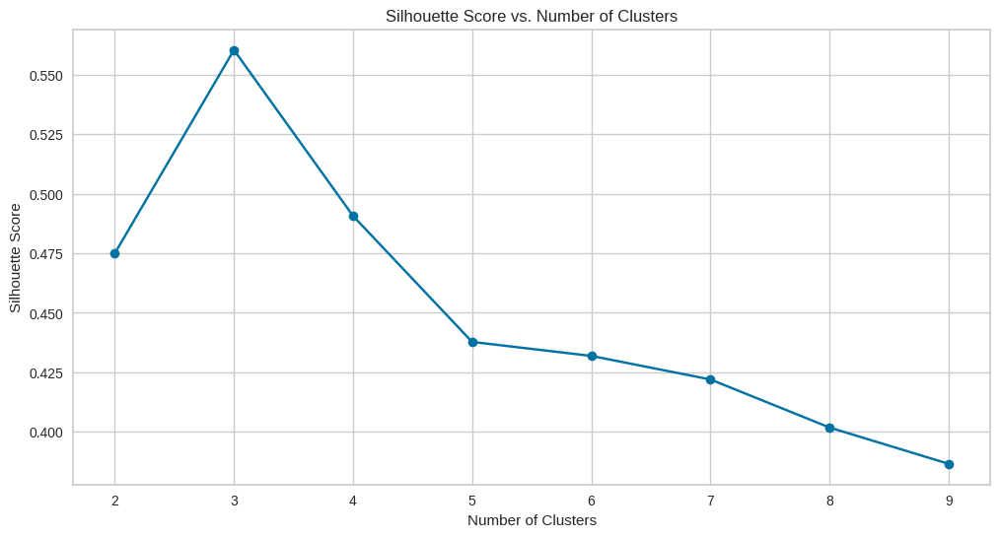

In [ ]:
scaler = StandardScaler()
X_standardized = scaler.fit_transform(Datapoint)
pca = PCA(n_components=2)
pca_std_datapoint = pca.fit_transform(X_standardized)
inertia = []
silhouette = {}

for i in tqdm(range(2, 10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter=500, random_state=17)
    kmeans.fit(pca_std_datapoint)
    inertia.append(kmeans.inertia_)
    silhouette[i] = sil(pca_std_datapoint, kmeans.labels_, metric='euclidean')

plt.figure(figsize=(12, 6))
plt.plot(range(2, 10), inertia, marker='o')
plt.title('Inertia vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(list(silhouette.keys()), list(silhouette.values()), marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

Tune the hyper parameters based on your conclusions.

In [ ]:
optimal_num_clusters = 3
model_kmeans = KMeans(n_clusters=optimal_num_clusters, random_state=0, init='k-means++')
y_predict_kmeans1 = model_kmeans.fit_predict(pca_std_datapoint)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


#Now plot the datapoints usig two first features
(Each cluster in a different colour)

In [ ]:
Datapoint['Cluster'] = y_predict_kmeans1
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=Datapoint, palette='viridis', alpha=0.8)
plt.title('KMeans Clustering - PCA Plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()


ValueError: Could not interpret value `PC1` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

Do all previous steps for MinMax scaled data points.





Compare the results of different scaling methods in a PCA problem